In [5]:
#matthew berning, 2021

import os
import sys
import time

sys.path.insert(0, os.path.abspath(os.path.dirname('../model/')))
sys.path.insert(0, os.path.abspath(os.path.dirname('../data/')))
sys.path.insert(0, os.path.abspath(os.path.dirname('../utils/')))

from model import Model
from dataset import WheatAwnDataset
import inspection_functions
import tensor_operations
import input_validation

import PIL
import GPUtil
import pickle
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image as ImDisp
from mpl_toolkits.axes_grid1 import ImageGrid
from sklearn.metrics import confusion_matrix
from datetime import datetime
from tqdm import tqdm

import torch
import torch.nn as nn
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms

%matplotlib inline

### GPU Collection:

In [7]:
GPUtil.showUtilization()

| ID | GPU | MEM |
------------------
|  0 |  0% | 18% |
|  1 |  0% | 11% |
|  2 |  0% |  0% |
|  3 |  0% |  0% |


In [8]:
deviceIDs = GPUtil.getAvailable(order = 'first', limit = 1, maxLoad = 0.3, maxMemory = 0.3, includeNan=False, excludeID=[], excludeUUID=[])

print("most available GPU: ",deviceIDs[0])

most available GPU:  0


In [9]:
#assignment
os.environ["CUDA_VISIBLE_DEVICES"] = str(deviceIDs[0])

<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>

## Helper Functions:

In [19]:
def get_montages(model_name):
    search_dir = "/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/montages"
    os.chdir(search_dir)
    mont_files = filter(os.path.isfile, os.listdir(search_dir))
    mont_files = [os.path.join(search_dir, f) for f in mont_files]# add path to each file

    mont_files = [file for file in mont_files if file.endswith('.png')] #only get image (montage) files

    corrects = []
    incorrects = []
    
    for file in mont_files:
        if model_name in file:
            if 'incorrects' in file:
                incorrects.append(file)
            elif '_corrects' in file:
                corrects.append(file)
    
    print(f"found {len(corrects)} 'corrects' montages")
    print(f"found {len(incorrects)} 'incorrects' montages")
    
    return corrects, incorrects

### This Notebook will be used to Evaluate Trained Models on Testing Data
-both 2020 and 2019 testing data will be used<br/>-we will also use it to visualize model performance<br/>-we can also directly compare variout trained models<br/>-each evaluation block will start with a markdown cell containing the **"path/to/the/model's/state_dtict.pth"** file as well as the hyper parmeters used

In [20]:
#sort image files (accuracy vs loss plots)
search_dir = "/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/"
os.chdir(search_dir)
plot_files = filter(os.path.isfile, os.listdir(search_dir))
plot_files = [os.path.join(search_dir, f) for f in plot_files]# add path to each file

plot_files = [file for file in plot_files if file.endswith('.jpg')]
plot_files.sort(key=lambda x: os.path.getmtime(x))

for file in plot_files:
    print(f"file: {file.split('/')[-1]}\n time: {datetime.fromtimestamp(os.path.getmtime(file))}\n")

file: test_loss_accuracy-plot.jpg
 time: 2021-10-17 14:56:08.634031

file: 2021-10-17-15_24_58_loss_accuracy-plot.jpg
 time: 2021-10-17 15:24:58.844047

file: 2021-10-17-15_27_56_loss_accuracy-plot.jpg
 time: 2021-10-17 15:27:56.908515

file: 2021-10-17-16_03_58_loss_accuracy-plot.jpg
 time: 2021-10-17 16:03:58.574784

file: 2021-10-19-12_20_00_loss_accuracy-plot.jpg
 time: 2021-10-19 12:23:38.676288

file: 2021-10-19-12_43_19_loss_accuracy-plot.jpg
 time: 2021-10-19 12:43:48.781290

file: 2021-10-19-12_45_24_loss_accuracy-plot.jpg
 time: 2021-10-19 12:45:53.247819

file: 2021-10-19-12_47_53_loss_accuracy-plot.jpg
 time: 2021-10-19 12:48:22.072233

file: 2021-10-19-12_49_28_loss_accuracy-plot.jpg
 time: 2021-10-19 12:49:58.360736

file: 2021-10-19-13_01_59_loss_accuracy-plot.jpg
 time: 2021-10-19 13:02:28.148023

file: 2021-10-19-13_04_30_loss_accuracy-plot.jpg
 time: 2021-10-19 13:04:53.676319

file: 2021-10-19-13_05_34_loss_accuracy-plot.jpg
 time: 2021-10-19 13:06:02.199813

file: 2

In [24]:
#sort state_dict (.pth) files in runs dir
search_dir = "/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/"
os.chdir(search_dir)
pth_files = filter(os.path.isfile, os.listdir(search_dir))
pth_files = [os.path.join(search_dir, f) for f in pth_files]# add path to each file

pth_files = [file for file in pth_files if file.endswith('.pth')] #only get model files
pth_files.sort(key=lambda x: os.path.getmtime(x))

for file in pth_files:
    print(f"file: {file.split('/')[-1]}\n time: {datetime.fromtimestamp(os.path.getmtime(file))}\n")
          
for file in pth_files:
    print(f"{file.split('/')[-1]},")

file: 2021-10-20-06_44_27_model_epoch-5.pth
 time: 2021-10-20 16:22:36.356746

file: 2021-10-20-06_44_27_model_epoch-9.pth
 time: 2021-10-20 20:45:13.169098

file: 2021-10-21-17_52_20_model_epoch-5.pth
 time: 2021-10-22 08:07:32.663433

file: 2021-10-21-17_52_20_model_epoch-9.pth
 time: 2021-10-23 00:20:33.535833

file: 2021-10-23-16_47_15_model_epoch-2_val-acc-90.148.pth
 time: 2021-10-23 22:48:31.256144

file: 2021-10-23-16_47_15_model_epoch-3_val-acc-90.161.pth
 time: 2021-10-24 00:52:14.608295

file: 2021-10-23-16_47_15_model_epoch-4_val-acc-90.352.pth
 time: 2021-10-24 02:55:27.114152

file: 2021-10-23-16_47_15_model_epoch-5_val-acc-90.269.pth
 time: 2021-10-24 04:58:57.548441

file: 2021-10-23-16_47_15_model_epoch-6_val-acc-89.732.pth
 time: 2021-10-24 07:02:16.912346

file: 2021-10-24-19_00_27_model_epoch-1_val-acc-90.599.pth
 time: 2021-10-24 23:58:38.276517

file: 2021-10-24-19_00_27_model_epoch-2_val-acc-90.186.pth
 time: 2021-10-25 04:11:39.851007

file: 2021-10-24-19_00_27_

In [22]:
#sort training history (.pkl) pickel files
search_dir = "/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/"
os.chdir(search_dir)
pkl_files = filter(os.path.isfile, os.listdir(search_dir))
pkl_files = [os.path.join(search_dir, f) for f in pkl_files]# add path to each file

pkl_files = [file for file in pkl_files if file.endswith('.pkl')] #only get history files
pkl_files.sort(key=lambda x: os.path.getmtime(x))

for file in pkl_files:
    print(f"file: {file.split('/')[-1]}\n time: {datetime.fromtimestamp(os.path.getmtime(file))}\n")

file: 2021-10-23-15_52_39_training_history.pkl
 time: 2021-10-23 15:52:44.139489

file: 2021-10-23-15_53_17_training_history.pkl
 time: 2021-10-23 16:00:27.197370

file: 2021-10-23-15_53_18_training_history.pkl
 time: 2021-10-23 16:00:44.470999

file: 2021-10-23-16_05_39_training_history.pkl
 time: 2021-10-23 16:05:45.980995

file: 2021-10-23-16_30_54_training_history.pkl
 time: 2021-10-23 16:31:15.886774

file: 2021-10-23-16_47_15_training_history.pkl
 time: 2021-10-24 07:02:14.425256

file: 2021-10-24-14_42_28_training_history.pkl
 time: 2021-10-24 14:42:50.211154

file: 2021-10-24-14_44_38_training_history.pkl
 time: 2021-10-24 14:45:00.006880

file: 2021-10-24-14_46_21_training_history.pkl
 time: 2021-10-24 14:46:48.697838

file: 2021-10-24-19_00_27_training_history.pkl
 time: 2021-10-25 08:18:53.034948

file: 2021-10-25-08_40_08_training_history.pkl
 time: 2021-10-26 18:16:44.935458

file: 2021-11-05-09_42_40_training_history.pkl
 time: 2021-11-07 05:50:13.456038

file: 2021-11-15

<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>

<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>
<hr/>

# MODEL ASSESMENTS

### model training: 2021-11-28
**lr** = 0.00001 (with MultiplicativeLR scheduler, lmbda = lambda epoch: 0.95 ** epoch)<br/>**batch_size** = 32<br/>**epochs** = 10 <br/>**train dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_train_awns_UNDERsampled.csv' (reconstituted/new sampling scheme) <br/>**validation dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns.csv'<br/>**model state_dicts:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-28-23_14_19_model_epoch-1_val-acc-82.283.pth,
2021-11-28-23_14_19_model_epoch-2_val-acc-86.437.pth,
2021-11-28-23_14_19_model_epoch-3_val-acc-83.137.pth,
2021-11-28-23_14_19_model_epoch-4_val-acc-88.579.pth,
2021-11-28-23_14_19_model_epoch-5_val-acc-85.138.pth,
2021-11-28-23_14_19_model_epoch-6_val-acc-88.013.pth,
2021-11-28-23_14_19_model_epoch-7_val-acc-89.866.pth,
2021-11-28-23_14_19_model_epoch-8_val-acc-88.472.pth,
2021-11-28-23_14_19_model_epoch-9_val-acc-84.462.pth,
2021-11-28-23_14_19_model_epoch-10_val-acc-82.913.pth<br/>**training history:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-28-23_14_19_training_history.pkl'<br/> **Note:** no dataset normalization was used during training, this was also the first run with ResNet50 and an attempt at online undersampling during the validation phase  

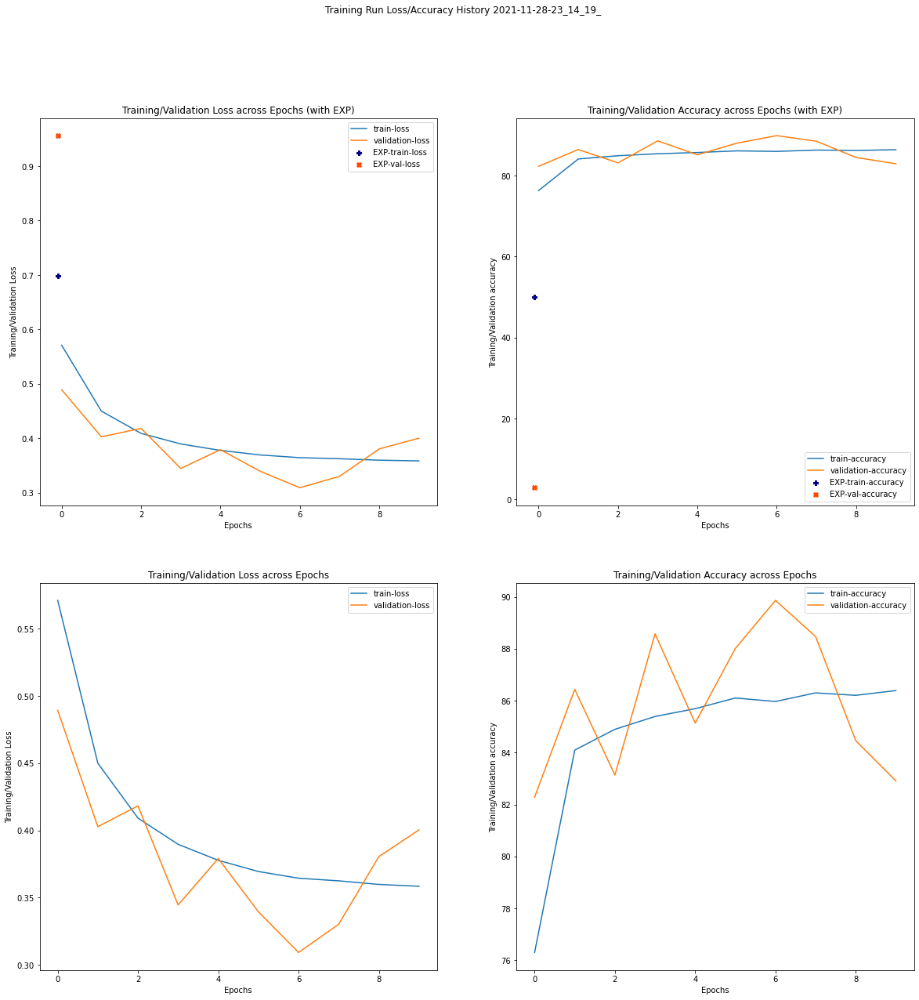

In [25]:
plot_training_history(history_dict_pkl_path='/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-28-23_14_19_training_history.pkl')

In [26]:
#looks like epoch 6 is again the best, instantiate it 
print(f"loading model from: 2021-11-28-23_14_19_model_epoch-6_val-acc-88.013.pth")
saved_model = Model('resnet50').construct_model(verbose=False)
saved_model.load_state_dict(torch.load('/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-28-23_14_19_model_epoch-6_val-acc-88.013.pth'))

loading model from: 2021-11-28-23_14_19_model_epoch-6_val-acc-88.013.pth


<All keys matched successfully>

In [27]:
#send the model to the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
saved_model = saved_model.to(device)
print("device: ",device)

device:  cuda:0


data file "2019_val_awns_oversampled.csv" contains 152740 rows


Confusion Matrix - Validation Set Progress: 100%|██████████| 2387/2387 [46:37<00:00,  1.17s/it]  


accuracy:  83.11


predictions:    152740
ground truths:  152740


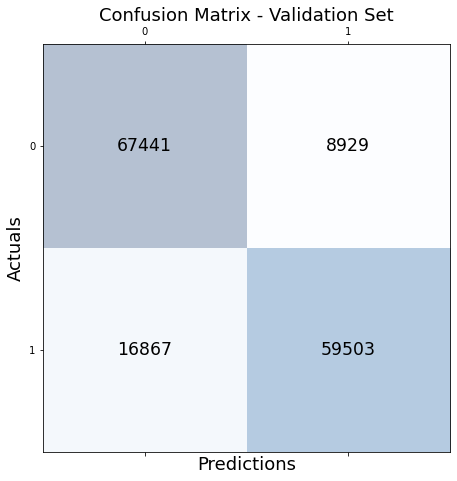

In [28]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns_oversampled.csv'
batch_size = 64
title = 'Confusion Matrix - Validation Set'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title, device)

data file "2019_test_awns.csv" contains 40579 rows


Confusion Matrix - Test Set (2019) Progress: 100%|██████████| 635/635 [16:52<00:00,  1.59s/it]


accuracy:  88.95


predictions:    40579
ground truths:  40579


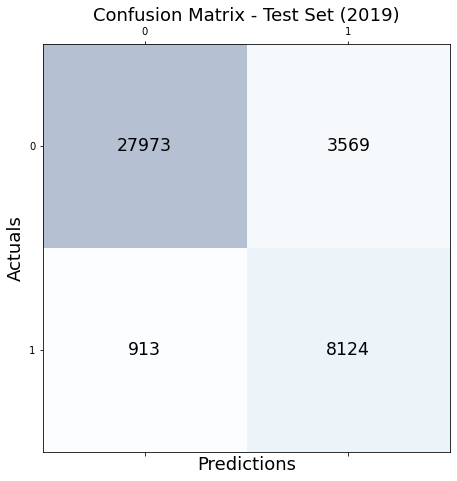

In [29]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_test_awns.csv'
batch_size = 64
title = 'Confusion Matrix - Test Set (2019)'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title, device)

data file "2020_test_awns.csv" contains 43631 rows


Confusion Matrix - Test Set (2020) Progress: 100%|██████████| 682/682 [21:03<00:00,  1.85s/it] 


accuracy:  76.57


predictions:    43631
ground truths:  43631


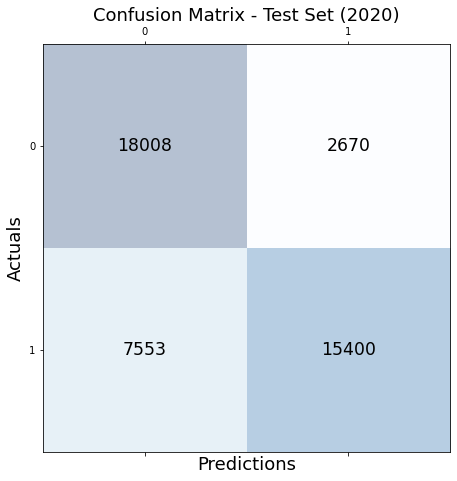

In [30]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_test_awns.csv'
batch_size = 64
title = 'Confusion Matrix - Test Set (2020)'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title, device)

### model training: 2021-11-15
**lr** = 0.00001 (with MultiplicativeLR scheduler, lmbda = lambda epoch: 0.95 ** epoch)<br/>**batch_size** = 32<br/>**epochs** = 10 <br/>**train dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_train_awns_UNDERsampled.csv' (reconstituted/new sampling scheme) <br/>**validation dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns_oversampled.csv'<br/>**model state_dicts:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-15-23_14_01_model_epoch-1_val-acc-87.236.pth,
2021-11-15-23_14_01_model_epoch-2_val-acc-88.239.pth,
2021-11-15-23_14_01_model_epoch-3_val-acc-88.117.pth,
2021-11-15-23_14_01_model_epoch-4_val-acc-88.259.pth,
2021-11-15-23_14_01_model_epoch-5_val-acc-88.176.pth,
2021-11-15-23_14_01_model_epoch-6_val-acc-88.676.pth,
2021-11-15-23_14_01_model_epoch-7_val-acc-88.988.pth,
2021-11-15-23_14_01_model_epoch-8_val-acc-89.009.pth,
2021-11-15-23_14_01_model_epoch-9_val-acc-88.919.pth,
2021-11-15-23_14_01_model_epoch-10_val-acc-88.879.pthh<br/>**training history:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-15-23_14_01_training_history.pkl'<br/> **Note:** no dataset normalization was used during training

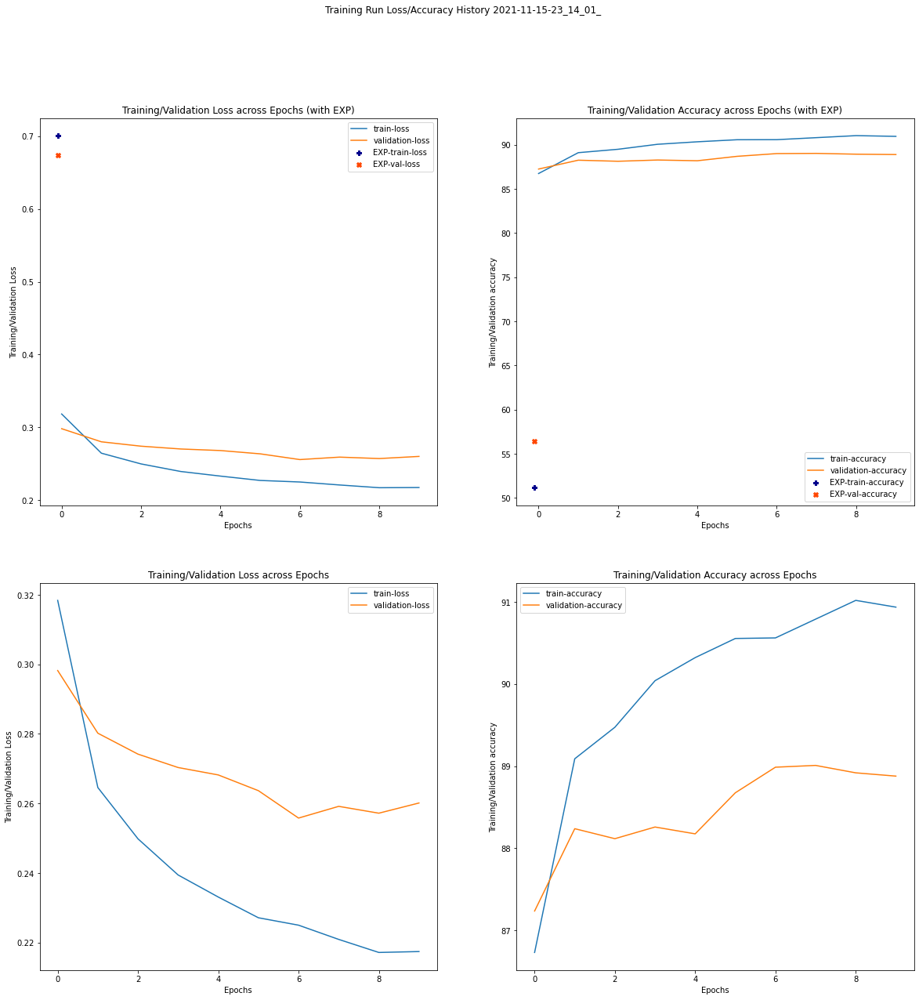

In [31]:
plot_training_history(history_dict_pkl_path='/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-15-23_14_01_training_history.pkl')

In [11]:
#looks like epoch 6 is best, instantiate it 
print(f"loading model from: runs/2021-11-15-23_14_01_model_epoch-6_val-acc-88.676.pth")
saved_model = Model('vgg16').construct_model(verbose=False)
saved_model.load_state_dict(torch.load('/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-15-23_14_01_model_epoch-6_val-acc-88.676.pth'))

loading model from: runs/2021-11-15-23_14_01_model_epoch-6_val-acc-88.676.pth


<All keys matched successfully>

In [12]:
#send the model to the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
saved_model = saved_model.to(device)
print("device: ",device)

device:  cuda:0


data file "2019_val_awns_oversampled.csv" contains 152740 rows


Confusion Matrix - Validation Set Progress: 100%|██████████| 2387/2387 [46:38<00:00,  1.17s/it]


accuracy:  88.68


predictions:    152740
ground truths:  152740


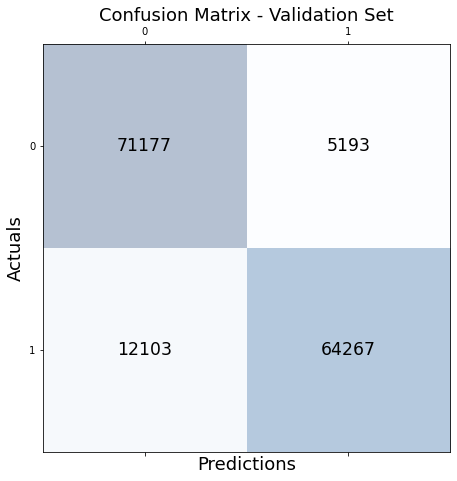

In [291]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns_oversampled.csv'
batch_size = 64
title = 'Confusion Matrix - Validation Set'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title, device)

data file "2019_test_awns.csv" contains 40579 rows


Confusion Matrix - Test Set (2019) Progress: 100%|██████████| 635/635 [14:25<00:00,  1.36s/it]


accuracy:  93.00


predictions:    40579
ground truths:  40579


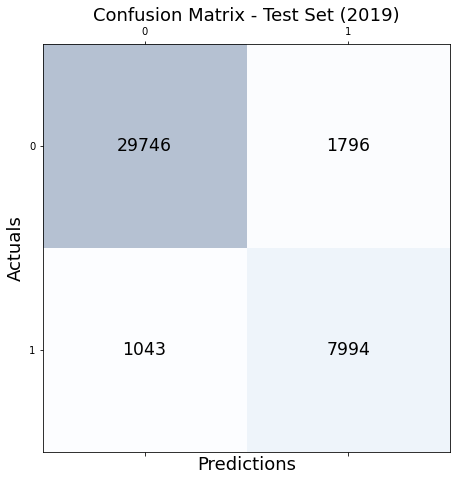

In [289]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_test_awns.csv'
batch_size = 64
title = 'Confusion Matrix - Test Set (2019)'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title, device)

data file "2020_test_awns.csv" contains 43631 rows


Confusion Matrix - Test Set (2020) Progress: 100%|██████████| 682/682 [14:41<00:00,  1.29s/it]

accuracy:  80.43


predictions:    43631
ground truths:  43631


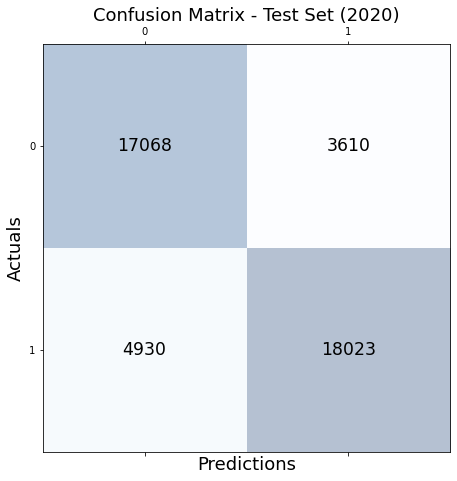

In [287]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_test_awns.csv'
batch_size = 64
title = 'Confusion Matrix - Test Set (2020)'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title, device)

In [432]:
#get a sampling of incorrect predictions
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_test_awns.csv'

imgs, predicted_labels, groundtruth_labels, plot_id_GT, pred_confs = collect_fifty_random_preds(data_csv, 
                                                                                                saved_model, 
                                                                                                find_incorrects=True)

data file "2020_test_awns.csv" contains 43631 rows


Progress:   1%|          | 23/4364 [00:05<16:41,  4.33it/s]

collected:  50 50 50 50 50


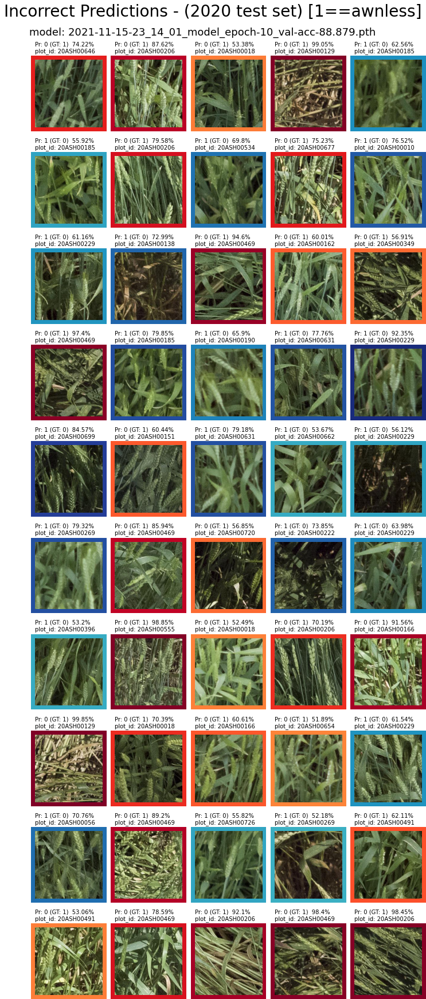

In [434]:
%matplotlib inline

fig_title = "Incorrect Predictions - (2020 test set) [1==awnless]"
model_pth_name = '2021-11-15-23_14_01_model_epoch-10_val-acc-88.879.pth'

plot_incorrects_grid(imgs, 
                     predicted_labels, 
                     groundtruth_labels, 
                     plot_id_GT, 
                     fig_title, 
                     model_pth_name, 
                     open_dict_from_pkl('/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_plot-id_to_num_dict.pkl'), 
                     pred_confs)

In [436]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_test_awns.csv'

imgs, predicted_labels, groundtruth_labels, plot_id_GT, pred_confs = collect_fifty_random_preds(data_csv, saved_model, find_incorrects=True, collect_class='1')

data file "2020_test_awns.csv" contains 43631 rows


Progress:   0%|          | 3/4364 [00:00<15:16,  4.76it/s]

found missed prediction class:  tensor(1, device='cuda:0')


Progress:   0%|          | 7/4364 [00:01<14:43,  4.93it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   0%|          | 9/4364 [00:01<14:38,  4.96it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   0%|          | 10/4364 [00:02<14:41,  4.94it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   0%|          | 12/4364 [00:02<14:34,  4.98it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   0%|          | 13/4364 [00:02<14:37,  4.96it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   0%|          | 15/4364 [00:03<14:29,  5.00it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   0%|          | 17/4364 [00:03<14:25,  5.03it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   0%|          | 19/4364 [00:03<14:21,  5.05it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   0%|          | 21/4364 [00:04<14:42,  4.92it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 24/4364 [00:04<14:22,  5.03it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 26/4364 [00:05<14:17,  5.06it/s]

found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 27/4364 [00:05<14:13,  5.08it/s]

found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 29/4364 [00:05<14:21,  5.03it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 31/4364 [00:06<14:17,  5.05it/s]

found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 34/4364 [00:06<14:43,  4.90it/s]

found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 37/4364 [00:07<14:23,  5.01it/s]

found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 39/4364 [00:07<14:19,  5.03it/s]

found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 41/4364 [00:08<14:38,  4.92it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 43/4364 [00:08<14:28,  4.98it/s]

found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 49/4364 [00:09<14:13,  5.05it/s]

found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 50/4364 [00:10<14:11,  5.07it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|          | 52/4364 [00:10<14:12,  5.06it/s]

found missed prediction class:  tensor(1, device='cuda:0')
found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|▏         | 57/4364 [00:11<14:18,  5.02it/s]

found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|▏         | 58/4364 [00:11<14:14,  5.04it/s]

found missed prediction class:  tensor(1, device='cuda:0')


Progress:   1%|▏         | 59/4364 [00:12<14:35,  4.91it/s]

found missed prediction class:  tensor(1, device='cuda:0')
collected:  50 50 50 50 50


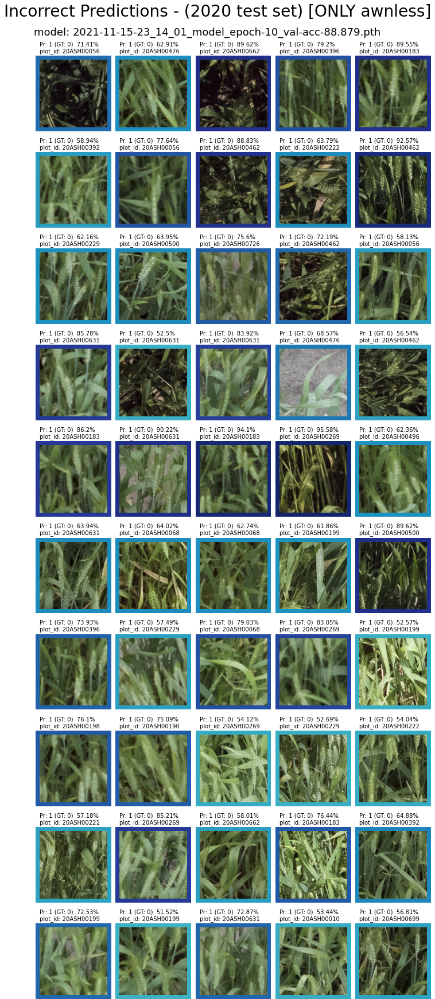

In [437]:
%matplotlib inline

fig_title = "Incorrect Predictions - (2020 test set) [ONLY awnless]"
model_pth_name = '2021-11-15-23_14_01_model_epoch-10_val-acc-88.879.pth'

plot_incorrects_grid(imgs, 
                     predicted_labels, 
                     groundtruth_labels, 
                     plot_id_GT, 
                     fig_title, 
                     model_pth_name, 
                     open_dict_from_pkl('/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_plot-id_to_num_dict.pkl'), 
                     pred_confs)

In [443]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_test_awns.csv'

imgs, predicted_labels, groundtruth_labels, plot_id_GT, pred_confs = collect_fifty_random_preds(data_csv, saved_model, find_incorrects=True, collect_class='0')

data file "2020_test_awns.csv" contains 43631 rows


Progress:   1%|          | 39/4364 [00:08<14:52,  4.84it/s]

collected:  50 50 50 50 50


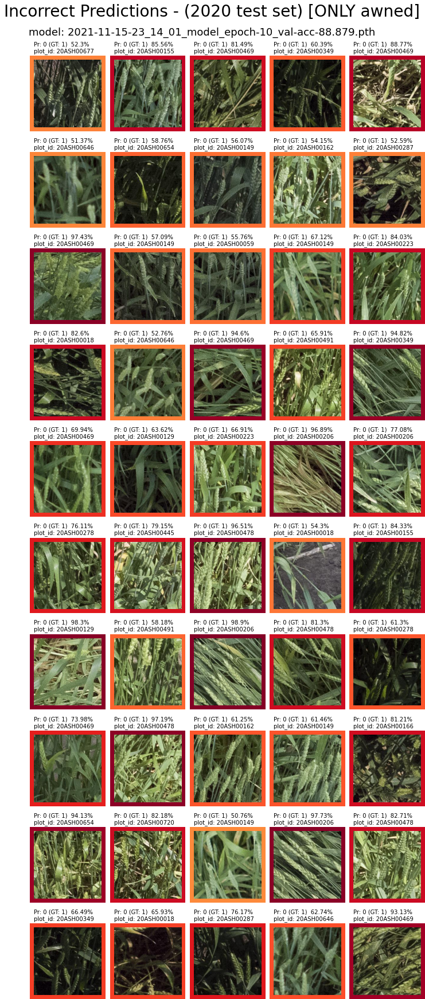

In [444]:
%matplotlib inline

fig_title = "Incorrect Predictions - (2020 test set) [ONLY awned]"
model_pth_name = '2021-11-15-23_14_01_model_epoch-10_val-acc-88.879.pth'

plot_incorrects_grid(imgs, 
                     predicted_labels, 
                     groundtruth_labels, 
                     plot_id_GT, 
                     fig_title, 
                     model_pth_name, 
                     open_dict_from_pkl('/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_plot-id_to_num_dict.pkl'), 
                     pred_confs)

### Plot-Level Voting

In [18]:
def poll_plots(data_csv, plot_id_dict, saved_model, device, confusion_matrix_title, verbose=False):
        
    #create validation transforms
    transform = transforms.Compose([transforms.CenterCrop((224,224)), transforms.ToTensor()])
    
    #build torch dataset/dataloader
    data = WheatAwnDataset(csv_filepath=data_csv, transform=transform)
    dataloader = DataLoader(data, batch_size=64, shuffle=True)
    
    #create dictionaries to hold all predictions for a plot
    plot_votes = {}
    #and all ground truth lables
    plot_GT = {}
    
    progress_bar = tqdm(dataloader, total=int(len(dataloader)), desc=f"Progress: ")

    for step, data in enumerate(progress_bar):

        images, labels, plot_ids = data[0], data[1], data[2]
        
        #send the tensors to the device (GPU)
        images = images.to(device)
        labels = labels.to(device)

        #images = images.float() #uncomment if using read_image() from torch
        outputs = saved_model(images)

        #find the predicted classes indicies
        _, preds = torch.max(outputs, 1)

        for index, plot_id in enumerate(plot_ids):
            
            #make the numeric plot_id a string 
            #so it can be a key in a dictionary
            plot_id = str(plot_id.item())

            #find all the current keys at each step
            current_plots = list(plot_votes.keys())
            
            #if the plot for the image is already in the dictionary
            #then just add the prediction
            if plot_id in current_plots:
                plot_votes[plot_id].append(preds[index].item())
                plot_GT[plot_id].append(labels[index].item())
            
            #otherwise make a new key in the dictionary
            #and add a list as the value, with the elem being the prediction
            else:
                plot_votes[plot_id]=[preds[index].item()]
                plot_GT[plot_id]=[labels[index].item()]
                
    #collect a list of the numeric representations of the plot_id's            
    numeric_plot_ids_list = list(plot_votes.keys())
    
    #count the plots and predictions and compare
    #with the ground truth
    awns = 0
    awnless = 0
    awn_corrects = 0
    awnless_corrects = 0
    total_corrects = 0
    
    #make lists of gt's and preds as well for the confoosion matrix
    plot_predictions = []
    plot_ground_truths = []

    for plot in numeric_plot_ids_list:
        
        #find the plot class from the first label in the plot ground 
        #truth dict for the plot in question
        plot_class = plot_GT[plot][0]
        
        #add the GT to the confusion matrix list
        plot_ground_truths.append(plot_class)

        if plot_class == 0:
            awns+=1
        else:
            awnless+=1

        if verbose: print("plot_id number: ", plot)
        if verbose: print("plot Ground Truth class: ", plot_class)
        
        #calculate the model's vote for the plot by summing the lables
        #the awnless label is 1 so if more than 50% of the plot is 1's then
        #the model voted for it to be awnless, else it's awned - 0's
        #(but there's also the posibility of a tie)
        vote = sum(plot_votes[plot])/len(plot_votes[plot])
        
        if vote  >= 0.5:
            
            #add to confusion matrix
            plot_predictions.append(1)
            
            if verbose: print("model predicted class: 1 (vote)")
            
            if plot_class == 1:
                awnless_corrects+=1

        elif vote < 0.5:
            
            #add to confusion matrix
            plot_predictions.append(0)
            
            if verbose: print("model predicted class: 0 (vote)")

            if plot_class == 0:
                awn_corrects+=1
        else:
            print("plot_id number: ", plot)
            print("plot Ground Truth class: ", plot_class)
            print("TIE!?")
        
        #collect the string representation of the plot id from the loaded json
        plot_id_string = list(plot_id_dict.keys())[list(plot_id_dict.values()).index(int(plot))]

        if verbose: print("plot_id string: ", plot_id_string, "\n")
        
    #report
    print("total awned plots: ",awns,"\ntotal awnless plots: ", awnless)
    print("awned pct. correct: ", round((awn_corrects/awns), 2)*100, "%")
    print("awnless pct. correct: ", round((awnless_corrects/awnless), 2)*100, "%")
    print("total pct. correct: ", round(((awnless_corrects+awn_corrects)/(awnless+awns)), 2)*100, "%")
    
    # Calculate the confusion matrix
    conf_matrix = confusion_matrix(y_true=plot_ground_truths, y_pred=plot_predictions)
    
    # Print the confusion matrix using Matplotlib
    fig, ax = plt.subplots(figsize=(7.5, 7.5))
    ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
    for i in range(conf_matrix.shape[0]):
        for j in range(conf_matrix.shape[1]):
            ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')

    plt.xlabel('Predictions', fontsize=18)
    plt.ylabel('Actuals', fontsize=18)
    plt.title(confusion_matrix_title, fontsize=18)
    plt.show()
    
    return plot_votes, plot_GT
    


data file "2020_test_awns.csv" contains 43631 rows


Progress: 100%|██████████| 682/682 [19:53<00:00,  1.75s/it]


total awned plots:  32 
total awnless plots:  32
awned pct. correct:  100.0 %
awnless pct. correct:  91.0 %
total pct. correct:  95.0 %


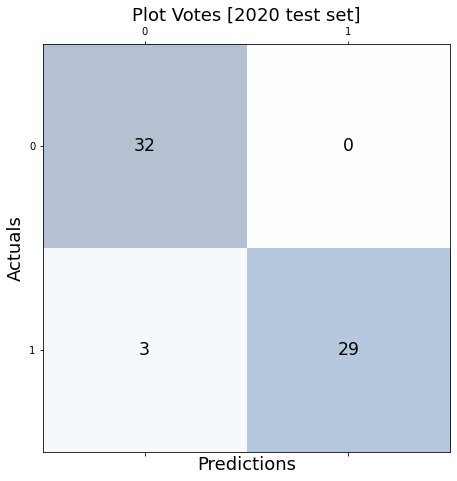

In [73]:
plot_id_dict = open_dict_from_pkl('/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_plot-id_to_num_dict.pkl')
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_test_awns.csv'
confusion_matrix_title = 'Plot Votes [2020 test set]'

inspection_functions.poll_plots(data_csv, plot_id_dict, saved_model, device, confusion_matrix_title, verbose=False)

data file "2019_test_awns.csv" contains 40579 rows


Progress: 100%|██████████| 635/635 [19:51<00:00,  1.88s/it]


total awned plots:  38 
total awnless plots:  8
awned pct. correct:  100.0 %
awnless pct. correct:  100.0 %
total pct. correct:  100.0 %


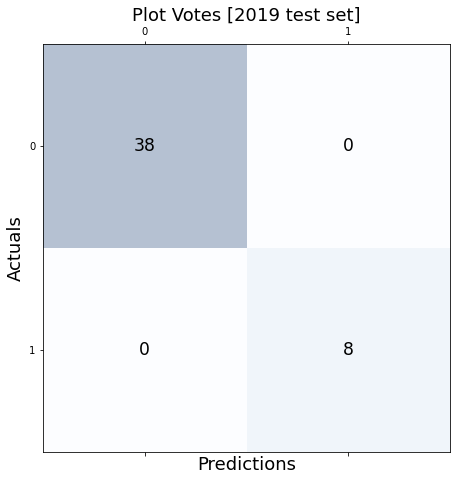

In [17]:
plot_id_dict = input_validation.open_dict_from_pkl('/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_plot-id_to_num_dict.pkl')
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_test_awns.csv'
confusion_matrix_title = 'Plot Votes [2019 test set]'

poll_plots(data_csv, plot_id_dict, saved_model, device, confusion_matrix_title, verbose=False)

### model training: 2021-11-05
**lr** = 0.00001 (with MultiplicativeLR scheduler, lmbda = lambda epoch: 0.55 ** epoch)<br/>**batch_size** = 32<br/>**epochs** = 10 (5 completed)<br/>**train dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_train_awns_oversampled.csv' (reconstituted/correctly sampled) <br/>**validation dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns_oversampled.csv'<br/>**model state_dicts:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-05-09_42_40_model_epoch-1_val-acc-88.339.pth,
2021-11-05-09_42_40_model_epoch-2_val-acc-89.123.pth,
2021-11-05-09_42_40_model_epoch-3_val-acc-88.990.pth,
2021-11-05-09_42_40_model_epoch-4_val-acc-89.126.pth,
2021-11-05-09_42_40_model_epoch-5_val-acc-89.125.pth,
2021-11-05-09_42_40_model_epoch-6_val-acc-89.110.pth<br/>**training history:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-05-09_42_40_training_history.pkl'<br/> **Note:** no dataset normalization was used during training

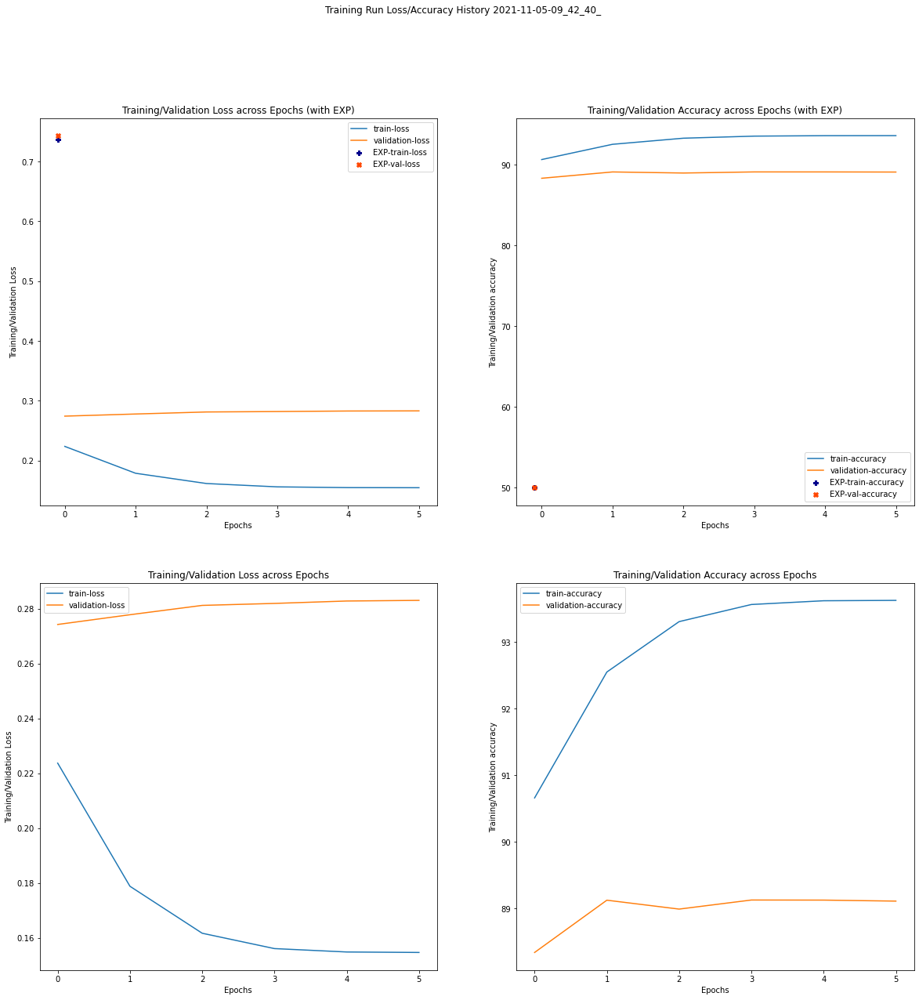

In [18]:
plot_training_history(history_dict_pkl_path='/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-05-09_42_40_training_history.pkl')

In [20]:
#instantiate the model
print(f"loading model from: {pth_files[-1]}")
saved_model = Model().construct_model(verbose=False)
saved_model.load_state_dict(torch.load('/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-05-09_42_40_model_epoch-4_val-acc-89.126.pth'))

loading model from: /pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-11-05-09_42_40_model_epoch-6_val-acc-89.110.pth


<All keys matched successfully>

In [21]:
#send the model to the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
saved_model = saved_model.to(device)

data file "2019_val_awns_oversampled.csv" contains 152740 rows


Confusion Matrix - Validation Set Progress: 100%|██████████| 2387/2387 [48:10<00:00,  1.21s/it]


accuracy:  89.13


predictions:    152740
ground truths:  152740


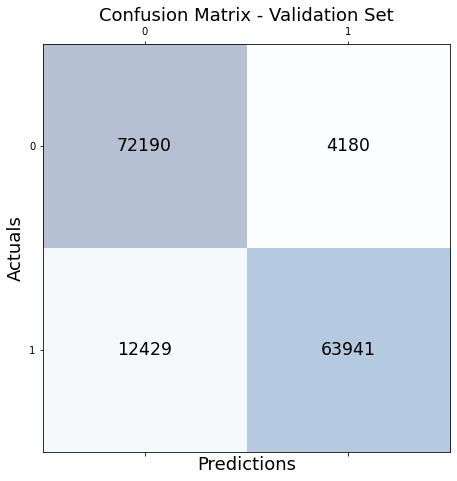

In [22]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns_oversampled.csv'
batch_size = 64
title = 'Confusion Matrix - Validation Set'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title)

data file "2019_test_awns.csv" contains 40579 rows


Confusion Matrix - Test Set (2019) Progress: 100%|██████████| 635/635 [14:27<00:00,  1.37s/it]


accuracy:  93.64


predictions:    40579
ground truths:  40579


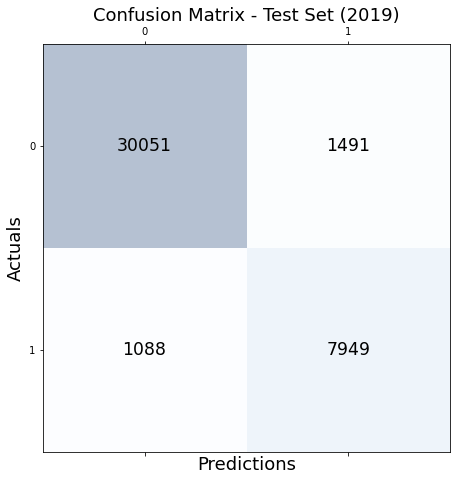

In [23]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_test_awns.csv'
batch_size = 64
title = 'Confusion Matrix - Test Set (2019)'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title)

data file "2020_test_awns.csv" contains 44163 rows


Confusion Matrix - Test Set (2020) Progress: 100%|██████████| 691/691 [15:27<00:00,  1.34s/it]


accuracy:  79.63


predictions:    44163
ground truths:  44163


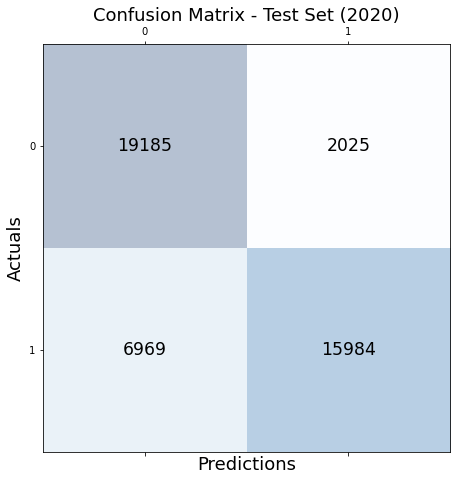

In [24]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_test_awns.csv'
batch_size = 64
title = 'Confusion Matrix - Test Set (2020)'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title)

In [345]:
#get a sampling of incorrect predictions
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_test_awns.csv'

imgs, predicted_labels, groundtruth_labels, plot_id_GT, pred_confs = collect_fifty_random_preds(data_csv, 
                                                                                                saved_model, 
                                                                                                find_incorrects=True)

data file "2020_test_awns.csv" contains 43631 rows


Progress:   1%|          | 33/4364 [00:06<15:11,  4.75it/s]

collected:  50 50 50 50 50


In [349]:
#collect the dictionary to translate plot_id number to the actual name
pkl_file_2020 = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_plot-id_to_num_dict.pkl'

plot_ids_dict_2020 = open_dict_from_pkl(pkl_file_2020)

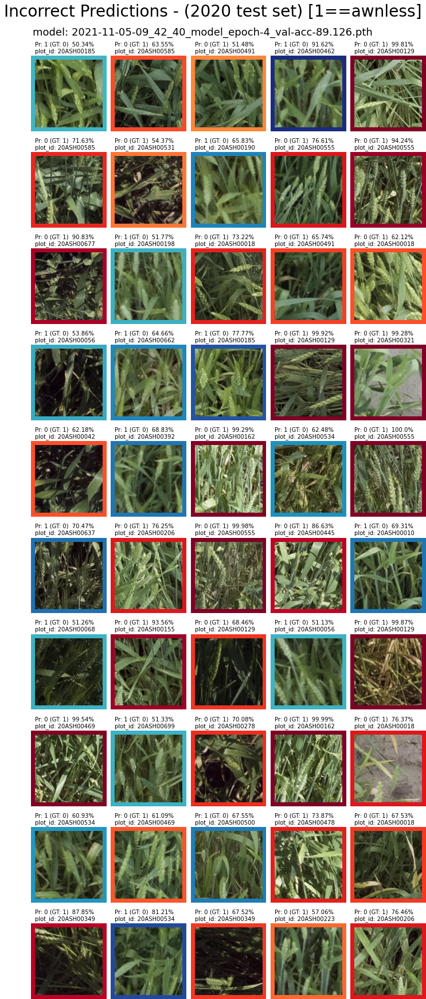

In [212]:
%matplotlib inline

fig_title = "Incorrect Predictions - (2020 test set) [1==awnless]"
model_pth_name = '2021-11-05-09_42_40_model_epoch-4_val-acc-89.126.pth'

plot_incorrects_grid(imgs, predicted_labels, groundtruth_labels, plot_id_GT, fig_title, model_pth_name, plot_ids_dict_2020, pred_confs)

In [351]:
#we collected all the incorrect predictions into montages
#let's take a look at some of the missed predictions
corrects_montages, incorrects_montages = get_montages(model_name='2021-11-05-09_42_40_model')

found 40 'corrects' montages
found 193 'incorrects' montages


In [352]:
print(incorrects_montages[0])
print(corrects_montages[0])

/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/montages/2021-11-05-09_42_40_model_epoch-4_val-acc-89_incorrects_in_2020_test_awns_dataset_37.png
/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/montages/2021-11-05-09_42_40_model_epoch-4_val-acc-89_corrects_in_2020_test_awns_dataset_10.png


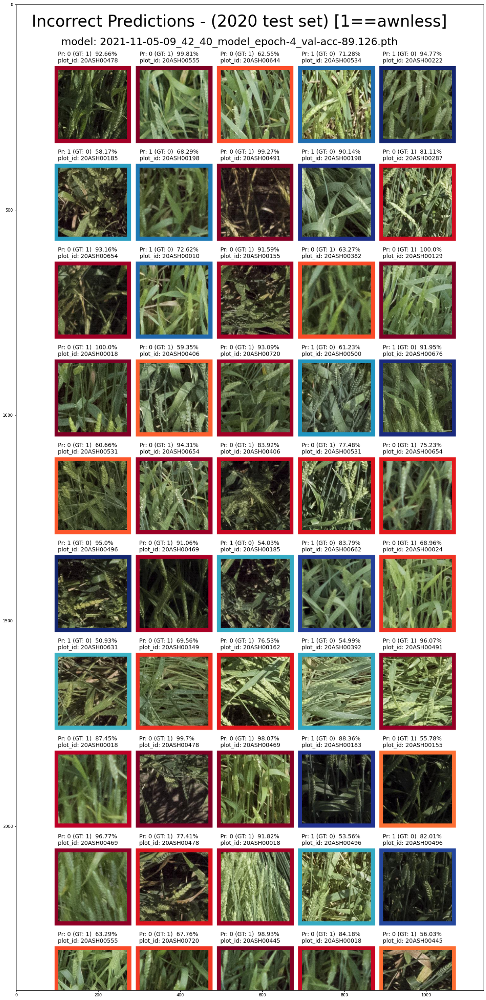

In [428]:
plot_saved_montage(incorrects_montages[0])

### model training: 2021-10-25
**lr** = 0.00001 (with MultiplicativeLR scheduler, lmbda = lambda epoch: 0.55 ** epoch)<br/>**batch_size** = 32<br/>**epochs** = 10<br/>**train dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_train_awns_oversampled.csv'<br/>**validation dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns_oversampled.csv'<br/>**model state_dicts:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-25-08_40_08_model_epoch-1_val-acc-90.533.pth', 2021-10-25-08_40_08_model_epoch-2_val-acc-90.396.pth, 2021-10-25-08_40_08_model_epoch-3_val-acc-90.510.pth, 2021-10-25-08_40_08_model_epoch-4_val-acc-90.729.pth, 2021-10-25-08_40_08_model_epoch-5_val-acc-90.727.pth, 2021-10-25-08_40_08_model_epoch-6_val-acc-90.734.pth, 2021-10-25-08_40_08_model_epoch-7_val-acc-90.734.pth<br/>**training history:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-25-08_40_08_training_history.pkl'<br/> **Note:** no dataset normalization was used during training

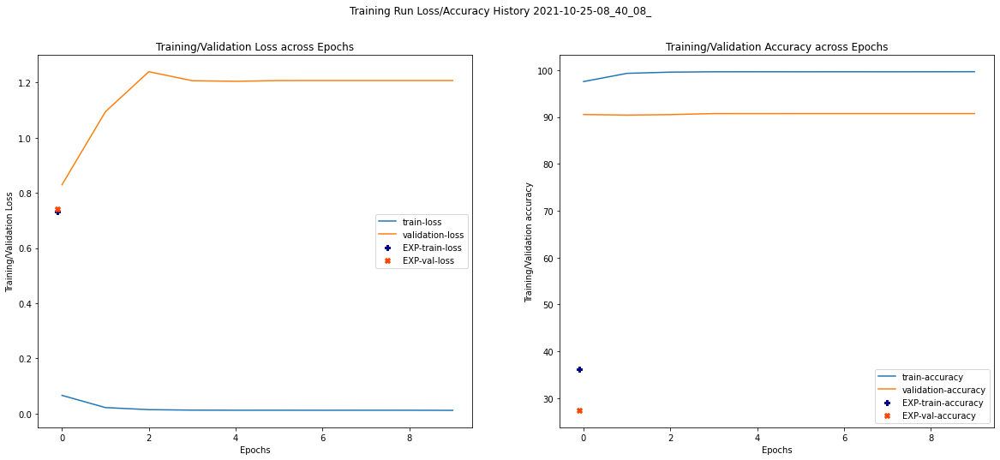

In [8]:
#training history plot for the run
plot_training_history(history_dict_pkl_path='/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-25-08_40_08_training_history.pkl')

In [9]:
#instantiate the model
print(f"loading model from: {pth_files[-1]}")
saved_model = Model().construct_model(verbose=False)
saved_model.load_state_dict(torch.load('/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-25-08_40_08_model_epoch-7_val-acc-90.734.pth'))

loading model from: /pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-25-08_40_08_model_epoch-10_val-acc-90.734.pth


<All keys matched successfully>

In [10]:
#send the model to the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
saved_model = saved_model.to(device)

#### verify the accuracy acheived on the validation set (used during training)

data file "2019_val_awns_oversampled.csv" contains 157052 rows


[validation] Progress: 100%|██████████| 2454/2454 [1:08:22<00:00,  1.67s/it]


accuracy:  90.73


predictions:    157052
ground truths:  157052


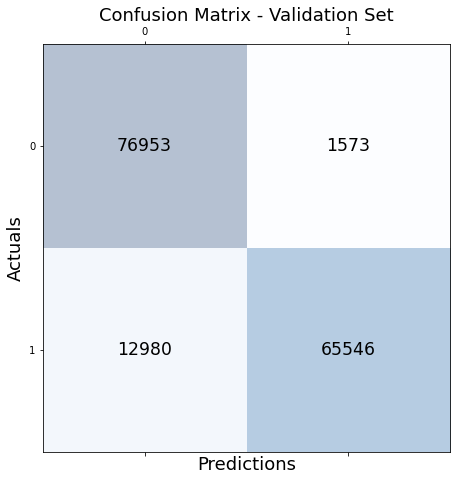

In [94]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns_oversampled.csv'
batch_size = 64
title = 'Confusion Matrix - Validation Set'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title)

### Determine the accuracy on the test set (2019)

data file "2019_test_awns.csv" contains 39991 rows


[validation] Progress: 100%|██████████| 625/625 [05:44<00:00,  1.81it/s]

accuracy:  92.64


predictions:    39991
ground truths:  39991


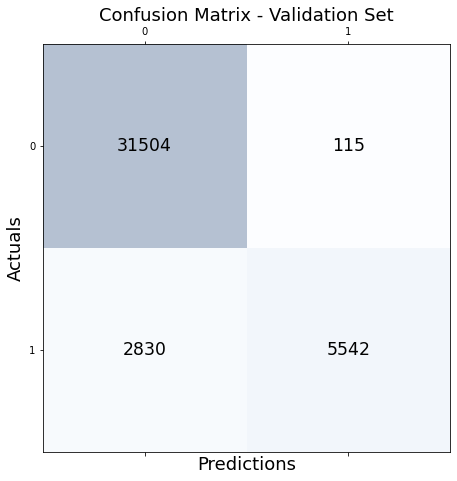

In [104]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_test_awns.csv'
batch_size = 64
title = 'Confusion Matrix - Test Set (2019)'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title)

## Determine the accuracy on the test set (2020)

data file "2020_test_awns.csv" contains 44163 rows


[validation] Progress: 100%|██████████| 691/691 [20:54<00:00,  1.82s/it]


accuracy:  67.42


predictions:    44163
ground truths:  44163


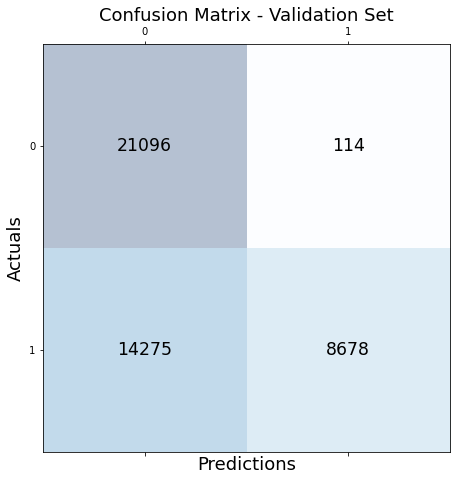

In [96]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2020_test_awns.csv'
batch_size = 64
title = 'Confusion Matrix - Test Set (2020)'

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model, title)

### model training: 2021-10-23
**lr** = 0.00001 (no scheduler)<br/>**batch_size** = 32<br/>**epochs** = 10<br/>**train dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_train_awns_oversampled.csv'<br/>**validation dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns_oversampled.csv'<br/>**model state_dicts:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-23-16_47_15_model_epoch-2_val-acc-90.148.pth, 2021-10-23-16_47_15_model_epoch-3_val-acc-90.161.pth, 2021-10-23-16_47_15_model_epoch-4_val-acc-90.352.pth, 2021-10-23-16_47_15_model_epoch-5_val-acc-90.269.pth, 2021-10-23-16_47_15_model_epoch-6_val-acc-89.732.pth<br/>**Note:** no dataset normalization was used during training



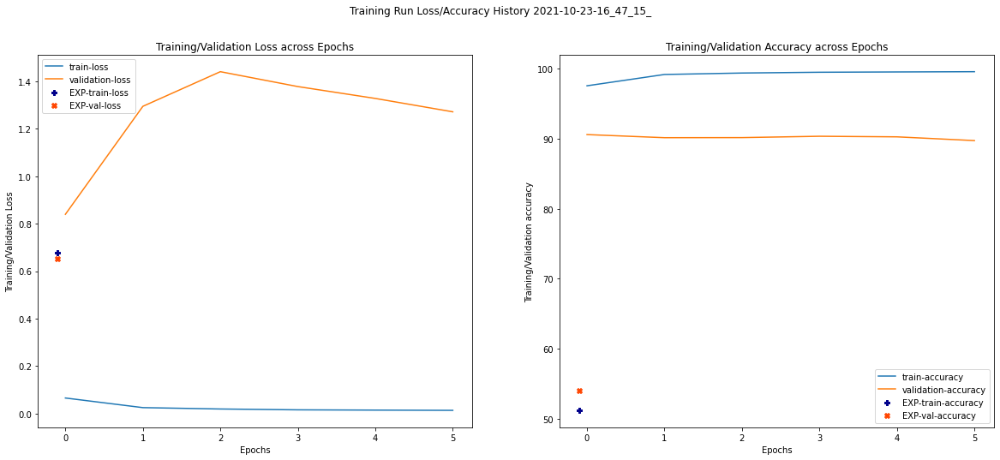

In [71]:
#training history plot for the run
plot_training_history(history_dict_pkl_path=pkl_files[-1])

In [72]:
#instantiate the model
print(f"loading model from: {pth_files[-1]}")
saved_model = Model().construct_model(verbose=False)
saved_model.load_state_dict(torch.load('/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-23-16_47_15_model_epoch-4_val-acc-90.352.pth'))

loading model from: /pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-23-16_47_15_model_epoch-6_val-acc-89.732.pth


<All keys matched successfully>

In [73]:
#send the model to the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
saved_model = saved_model.to(device)

#### verify the accuracy acheived on the validation set (used during training)

In [74]:
#collect test dataset and create loader iterable-object
dataset_path = '/pless_nfs/home/matthewrberning/multi-year-cult-class/data/preprocessed/'
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns_oversampled.csv'
batch_size = 64

transform = transforms.Compose([transforms.ToTensor()])

data = WheatAwnDataset(csv_filepath=data_csv, dataset_dir=dataset_path, transform=transform)
dataloader = DataLoader(data, batch_size=batch_size, shuffle=False)

data file "2019_val_awns_oversampled.csv" contains 157052 rows


In [75]:
#track the correct predictions
corrects = 0.0

#set model mode
saved_model.eval()

# Get the predictions/GT's for the confusion matrix
predictions = []
ground_truths = []

#make sure to not accumulate gradients
with torch.no_grad():
    
    progress_bar = tqdm(dataloader, total=int(len(dataloader)), desc='[validation] Progress: ')

    for step, data in enumerate(progress_bar):

        #unpack the data from the progress bar
        images, labels = data[0], data[1]

        #send the tensors to the device (GPU)
        images = images.to(device)
        labels = labels.to(device)

        #images = images.float() #uncomment if using read_image() from torch
        outputs = saved_model(images)

        #find the predicted classes indicies
        _, preds = torch.max(outputs, 1)

        #track the correct predictions
        corrects += torch.sum(preds == labels.data).item()
        
        ground_truths.extend(list(labels.cpu().numpy()))
        predictions.extend(list(preds.cpu().numpy()))

[validation] Progress: 100%|██████████| 2454/2454 [20:44<00:00,  1.97it/s]


In [76]:
#calculate the accuracy 
accuracy = (corrects/len(dataloader.dataset))*100
accuracy = "{:5.2f}".format(accuracy)
print("accuracy: ", accuracy)
print('\n')
print("predictions:   ", len(predictions))
print("ground truths: ", len(ground_truths))

accuracy:  90.35


predictions:    157052
ground truths:  157052


In [77]:
# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_true=ground_truths, y_pred=predictions)

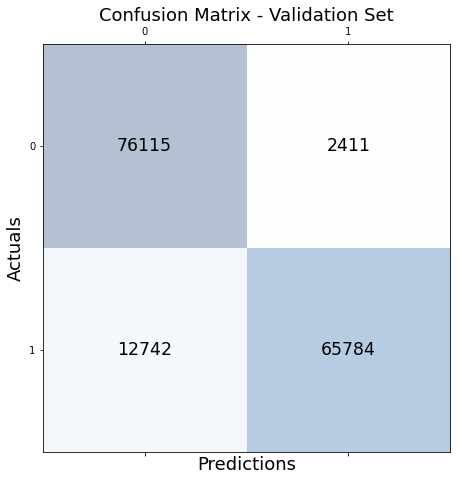

In [78]:
# Print the confusion matrix using Matplotlib
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix - Validation Set', fontsize=18)
plt.show()

### examine the accuracy on the test set (2019)

data file "2019_test_awns.csv" contains 39991 rows


[validation] Progress: 100%|██████████| 625/625 [05:36<00:00,  1.86it/s]

accuracy:  95.70


predictions:    39991
ground truths:  39991


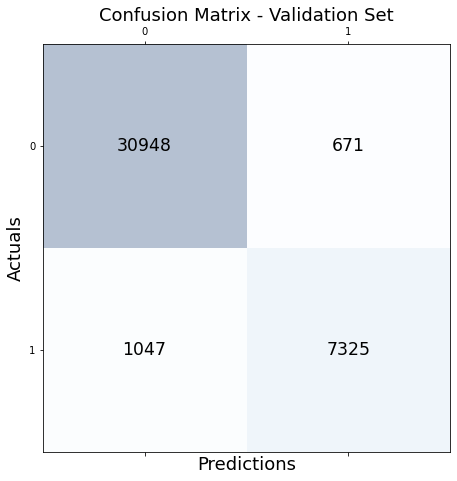

In [80]:
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_test_awns.csv'
batch_size = 64

#use helper fucntion
get_confusion_matrix_for_dataset(data_csv, batch_size, saved_model)

### model training: 2021-10-20
**lr** = 0.00001 (no scheduler)<br/>**batch_size** = 32<br/>**epochs** = 10<br/>**train dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_train_awns_oversampled.csv' (but actually imbalanced :P)<br/>**validation dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_test_awns.csv'<br/>**model state_dict:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-20-06_44_27_model_epoch-9.pth'


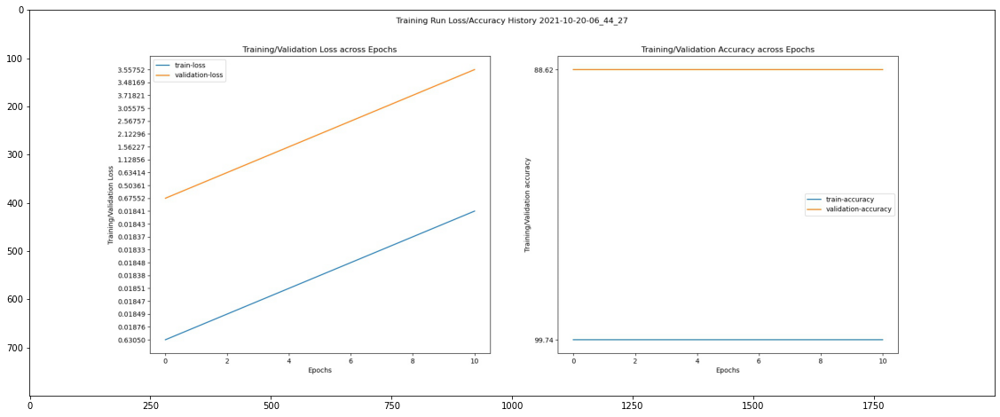

In [16]:
#training history plot for the run
plot_img = PIL.Image.open(plot_files[-1])
plt.figure(figsize = (20,8))
plt.imshow(plot_img)

In [47]:
#instantiate the model
print(f"loading model from: {pth_files[-1]}")
saved_model = Model().construct_model(verbose=False)
saved_model.load_state_dict(torch.load(pth_files[-1]))

loading model from: /pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-21-17_52_20_model_epoch-5.pth


<All keys matched successfully>

In [38]:
#send the model to the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
saved_model = saved_model.to(device)

#### verify the accuracy acheived on the validation set (used during training)

In [ ]:
#collect test dataset and create loader iterable-object
dataset_path = '/pless_nfs/home/matthewrberning/multi-year-cult-class/data/preprocessed/'
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_test_awns.csv'
batch_size = 32

transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize([77.7395, 83.9253, 53.3458], [48.1450, 49.1999, 36.7069])])

data = WheatAwnDataset(csv_filepath=data_csv, dataset_dir=dataset_path, transform=transform)
dataloader = DataLoader(data, batch_size=batch_size, shuffle=True)

In [26]:
#track the correct predictions
corrects = 0.0

#set model mode
saved_model.eval()

#make sure to not accumulate gradients
with torch.no_grad():
    
    progress_bar = tqdm(dataloader, total=int(len(dataloader)), desc='[validation] Progress: ')

    for step, data in enumerate(progress_bar):

        #unpack the data from the progress bar
        images, labels = data[0], data[1]

        #send the tensors to the device (GPU)
        images = images.to(device)
        labels = labels.to(device)

        #images = images.float() #uncomment if using read_image() from torch
        outputs = saved_model(images)

        #find the predicted classes indicies
        _, preds = torch.max(outputs, 1)

        #track the correct predictions
        corrects += torch.sum(preds == labels.data).item()

[validation] Progress: 100%|██████████| 10858/10858 [14:35<00:00, 12.41it/s]


In [27]:
#calculate the accuracy 
accuracy = (corrects/len(dataloader.dataset))*100
accuracy = "{:5.2f}".format(accuracy)
print("accuracy: ", accuracy)

accuracy:  88.62


In [40]:
# Get the predictions
predictions = []
ground_truths = []

progress_bar = tqdm(dataloader, total=int(len(dataloader)), desc='[test] Progress: ')

#set model mode
saved_model.eval()

for step, data in enumerate(progress_bar):
    
    #unpack the data from the progress bar
    images, labels = data[0], data[1]
    
    images = images.to(device)
    
    outputs = saved_model(images)
    _, preds = torch.max(outputs, 1)
    
    ground_truths.extend(list(labels.numpy()))
    predictions.extend(list(preds.cpu().numpy()))

print("predictions:   ", len(predictions))
print("ground truths: ", len(ground_truths))

[test] Progress: 100%|██████████| 2715/2715 [11:48<00:00,  3.83it/s]

predictions:    86863
ground truths:  86863


In [41]:
# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_true=ground_truths, y_pred=predictions)

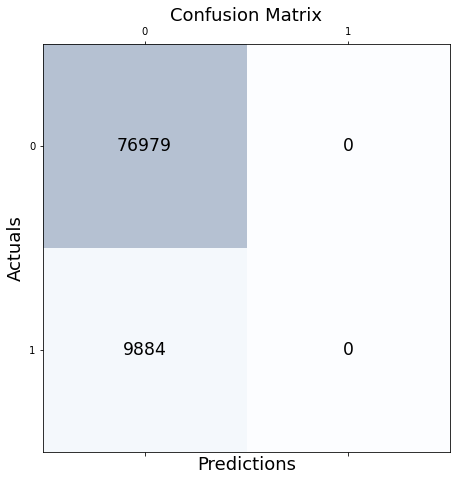

In [42]:
# Print the confusion matrix using Matplotlib
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

#### determine the accuracy on the test set

In [29]:
#collect test dataset and create loader iterable-object
dataset_path = '/pless_nfs/home/matthewrberning/multi-year-cult-class/data/preprocessed/'
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns.csv'
batch_size = 32

transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize([77.7395, 83.9253, 53.3458], [48.1450, 49.1999, 36.7069])])

data = WheatAwnDataset(csv_filepath=data_csv, dataset_dir=dataset_path, transform=transform)
dataloader = DataLoader(data, batch_size=batch_size, shuffle=True)

In [30]:
#track the correct predictions
corrects = 0.0

#set model mode
saved_model.eval()

#make sure to not accumulate gradients
with torch.no_grad():
    
    progress_bar = tqdm(dataloader, total=int(len(dataloader)), desc='[test] Progress: ')

    for step, data in enumerate(progress_bar):

        #unpack the data from the progress bar
        images, labels = data[0], data[1]

        #send the tensors to the device (GPU)
        images = images.to(device)
        labels = labels.to(device)

        #images = images.float() #uncomment if using read_image() from torch
        outputs = saved_model(images)

        #find the predicted classes indicies
        _, preds = torch.max(outputs, 1)

        #track the correct predictions
        corrects += torch.sum(preds == labels.data).item()

[test] Progress: 100%|██████████| 1026/1026 [09:34<00:00,  1.79it/s]


In [31]:
#calculate the accuracy 
accuracy = (corrects/len(dataloader.dataset))*100
accuracy = "{:5.2f}".format(accuracy)
print("accuracy: ", accuracy)

accuracy:  93.22


In [32]:
# Get the predictions
predictions = []
ground_truths = []

progress_bar = tqdm(dataloader, total=int(len(dataloader)), desc='[test] Progress: ')

#set model mode
saved_model.eval()

for step, data in enumerate(progress_bar):
    
    #unpack the data from the progress bar
    images, labels = data[0], data[1]
    
    images = images.to(device)
    
    outputs = saved_model(images)
    _, preds = torch.max(outputs, 1)
    
    ground_truths.extend(list(labels.numpy()))
    predictions.extend(list(preds.cpu().numpy()))

print("predictions:   ", len(predictions))
print("ground truths: ", len(ground_truths))

[test] Progress: 100%|██████████| 1026/1026 [04:34<00:00,  3.74it/s]

predictions:    32809
ground truths:  32809


In [33]:
# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_true=ground_truths, y_pred=predictions)

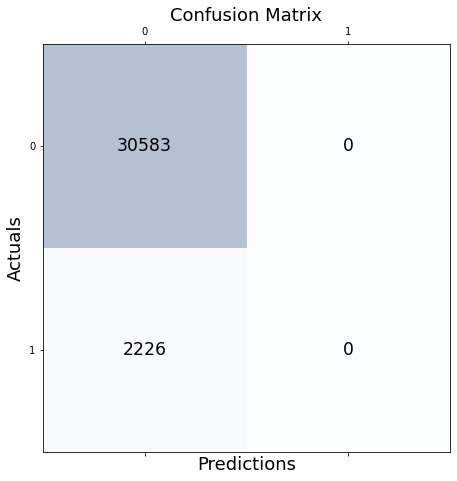

In [34]:
# Print the confusion matrix using Matplotlib
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix', fontsize=18)
plt.show()

### model training: 2021-10-21
**lr** = 0.00001 (no scheduler)<br/>**batch_size** = 32<br/>**epochs** = 10 (but stoped at epoch 6)<br/>**train dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_train_awns_oversampled.csv' (this time actually balanced)<br/>**validation dataset:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns_oversampled.csv'<br/>**model state_dict:** '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-21-17_52_20_model_epoch-5.pth'<br/>**Note:** no normalization was used during this training

In [48]:
#instantiate the model
print(f"loading model from: {pth_files[-1]}")
saved_model = Model().construct_model(verbose=False)
saved_model.load_state_dict(torch.load('/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-21-17_52_20_model_epoch-5.pth'))


loading model from: /pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/runs/2021-10-21-17_52_20_model_epoch-5.pth


<All keys matched successfully>

In [49]:
#send the model to the GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
saved_model = saved_model.to(device)
print("model to: ", device)

model to:  cuda:0


#### first verify the accuracy acheived on the validation set (during training)
-this is unfortunatley lower than the maximum axxuracy on the validation set because I was only saving every 5 epochs and it peaked around epoch 3 as far as I remmeber

In [50]:
#collect test dataset and create loader iterable-object
dataset_path = '/pless_nfs/home/matthewrberning/multi-year-cult-class/data/preprocessed/'
data_csv = '/pless_nfs/home/matthewrberning/wheat-awn-classification-multiyear/data/2019_val_awns_oversampled.csv'
batch_size = 32

transform = transforms.Compose([transforms.ToTensor()])

data = WheatAwnDataset(csv_filepath=data_csv, dataset_dir=dataset_path, transform=transform)
dataloader = DataLoader(data, batch_size=batch_size, shuffle=True)

data file "2019_val_awns_oversampled.csv" contains 157052 rows


In [51]:
#track the correct predictions
corrects = 0.0

#set model mode
saved_model.eval()

# Get the predictions/GT's for the confusion matrix
predictions = []
ground_truths = []

#make sure to not accumulate gradients
with torch.no_grad():
    
    progress_bar = tqdm(dataloader, total=int(len(dataloader)), desc='[validation] Progress: ')

    for step, data in enumerate(progress_bar):

        #unpack the data from the progress bar
        images, labels = data[0], data[1]

        #send the tensors to the device (GPU)
        images = images.to(device)
        labels = labels.to(device)

        #images = images.float() #uncomment if using read_image() from torch
        outputs = saved_model(images)

        #find the predicted classes indicies
        _, preds = torch.max(outputs, 1)

        #track the correct predictions
        corrects += torch.sum(preds == labels.data).item()
        
        ground_truths.extend(list(labels.cpu().numpy()))
        predictions.extend(list(preds.cpu().numpy()))

[validation] Progress: 100%|██████████| 4908/4908 [1:43:56<00:00,  1.27s/it]


In [52]:
#calculate the accuracy 
accuracy = (corrects/len(dataloader.dataset))*100
accuracy = "{:5.2f}".format(accuracy)
print("accuracy: ", accuracy)
print('\n')
print("predictions:   ", len(predictions))
print("ground truths: ", len(ground_truths))

accuracy:  89.54


predictions:    157052
ground truths:  157052


In [53]:
# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_true=ground_truths, y_pred=predictions)

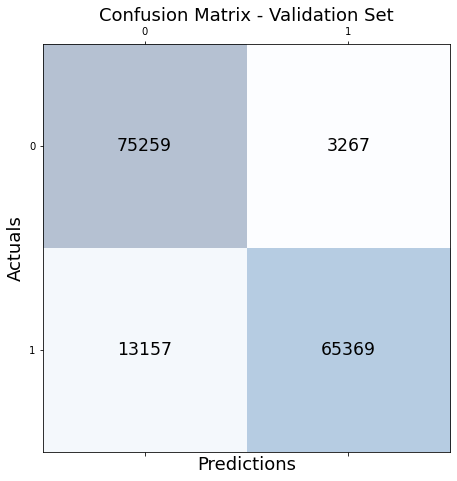

In [54]:
# Print the confusion matrix using Matplotlib
fig, ax = plt.subplots(figsize=(7.5, 7.5))
ax.matshow(conf_matrix, cmap=plt.cm.Blues, alpha=0.3)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        ax.text(x=j, y=i,s=conf_matrix[i, j], va='center', ha='center', size='xx-large')

plt.xlabel('Predictions', fontsize=18)
plt.ylabel('Actuals', fontsize=18)
plt.title('Confusion Matrix - Validation Set', fontsize=18)
plt.show()

In [6]:
a =99.109201273128301298

In [19]:
print(f"a= {a:.3f}")

a= 99.109


Factor =  0.55  , Learning Rate =  0.0001
Factor =  0.55  , Learning Rate =  9.5e-05
Factor =  0.55  , Learning Rate =  8.57375e-05
Factor =  0.55  , Learning Rate =  7.35091890625e-05
Factor =  0.55  , Learning Rate =  5.987369392383787e-05
Factor =  0.55  , Learning Rate =  4.632912301597531e-05
Factor =  0.55  , Learning Rate =  3.405616262881149e-05
Factor =  0.55  , Learning Rate =  2.3782688525533222e-05
Factor =  0.55  , Learning Rate =  1.577792147882268e-05
Factor =  0.55  , Learning Rate =  9.944025698709226e-06


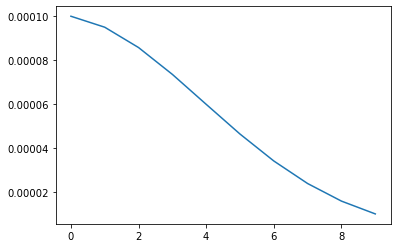

In [247]:
model = torch.nn.Linear(2, 1)
optimizer = torch.optim.SGD(model.parameters(), lr=0.0001)
lmbda = lambda epoch: 0.95 ** epoch
scheduler = torch.optim.lr_scheduler.MultiplicativeLR(optimizer, lr_lambda=lmbda)
lrs = []

for i in range(10):
    optimizer.step()
    lrs.append(optimizer.param_groups[0]["lr"])
    print("Factor = ",0.55," , Learning Rate = ",optimizer.param_groups[0]["lr"])
    scheduler.step()

plt.plot(range(10),lrs)